In [1]:
import matplotlib.pyplot as plt
from desc.magnetic_fields import FourierCurrentPotentialField
from desc.geometry import FourierRZToroidalSurface
from desc.io import load
import numpy as np
from desc.examples import get
from desc.grid import LinearGrid
from desc.plotting import *
from desc.equilibrium import Equilibrium

No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


DESC version 0.10.4+837.gb254db1a.dirty,using JAX backend, jax version=0.4.14, jaxlib version=0.4.14, dtype=float64
Using device: CPU, with 9.97 GB available memory


In [2]:
%pdb

Automatic pdb calling has been turned ON


/home/dpanici/DESC/desc/magnetic_fields.py:2579: UserWarning: Detected a coil contour (coil index 0) that may not be closed, this may lead to incorrect coils, check that the surface current potential contours do not contain any local maxima or window-pane-like structures, and that the current potential contours do not go across The edges of the zeta extent used for the plotting:the zeta=0 or zeta=2pi/NFP planes for helical coils or the zeta=-pi/NFP and zeta=2pi+pi/NFP planes, for modular coils. Use `show_plots=True` to visualize the contours.
  warnings.warn(


MixedCoilSet at 0x7f23c60031d0 (name=, with 1 submembers)

/home/dpanici/miniconda3/envs/desc-env/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


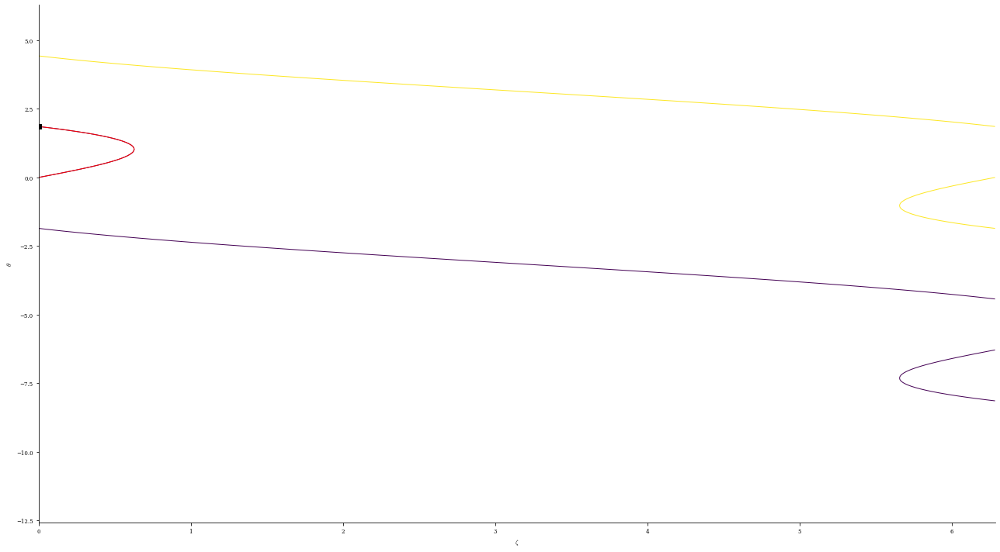

In [2]:
# make test to check the contour crossing

curr=1e4
field = FourierCurrentPotentialField(I=curr,G=curr, Phi_mn=np.array([-4*curr/13]),modes_Phi=np.array([[-1,0]]))
field.cut_surface_current_into_coils(1,show_plots=True)


In [4]:
FourierCurrentPotentialField().sym_Phi

'cos'

# Poloidal current derivation figure

In [2]:
eq = get("precise_QA")
# eq.Psi = -eq.Psi

# create the constant offset surface
surf = eq.surface.constant_offset_surface(offset=0.1, # desired offset
                                          M=16, # Poloidal resolution of desired offset surface
                                          N=12, # Toroidal resolution of desired offset surface
                                          grid=LinearGrid(M=32,N=24,NFP=eq.NFP)) # grid of points on base surface to evaluate unit normal and find points on offset surface,
                                                                                 # generally should be twice the desired resolution

# run regcoil
field = FourierCurrentPotentialField.from_surface(surf)
# field_modular=field
# data = field.run_regcoil(eq,alpha=1e-12,scan=False)#,scan_alphas=np.logspace(-30,-6,20))#,source_grid=LinearGrid(M=60,N=60,NFP=eq.NFP))

field_helical=field.copy()
result_helical = field_helical.run_regcoil(eq,current_helicity=0,alpha=0,scan=False,scan_alphas=np.logspace(-12,-6,20))#,source_grid=LinearGrid(M=60,N=60,NFP=eq.NFP))

field_helical.save("helical_surf_field_test.h5")


Timer: Jacobian Calculation = 8.61 sec


In [3]:
# from desc.io import load
# eq = get("precise_QA")
# field = load("helical_surf_field_test.h5")
# field_helical = field

In [4]:
# I was using alpha=0 offset of 0.2 or something for my orig figures...

({'fig_Bn': <Figure size 576x576 with 2 Axes>,
  'fig_Phi': <Figure size 720x720 with 2 Axes>},
 {'ax_Bn': <AxesSubplot: title={'center': 'Bnormal on plasma surface'}, xlabel='zeta', ylabel='theta'>,
  'ax_Phi': <AxesSubplot: title={'center': 'Total Current Potential on winding surface'}, xlabel='zeta', ylabel='theta'>})

/home/dpanici/miniconda3/envs/desc-env/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


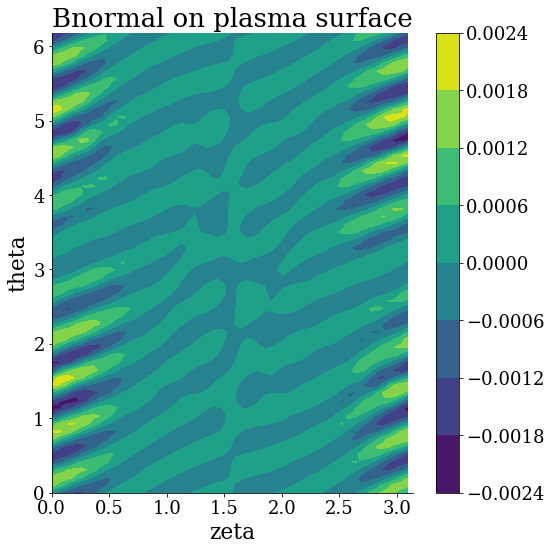

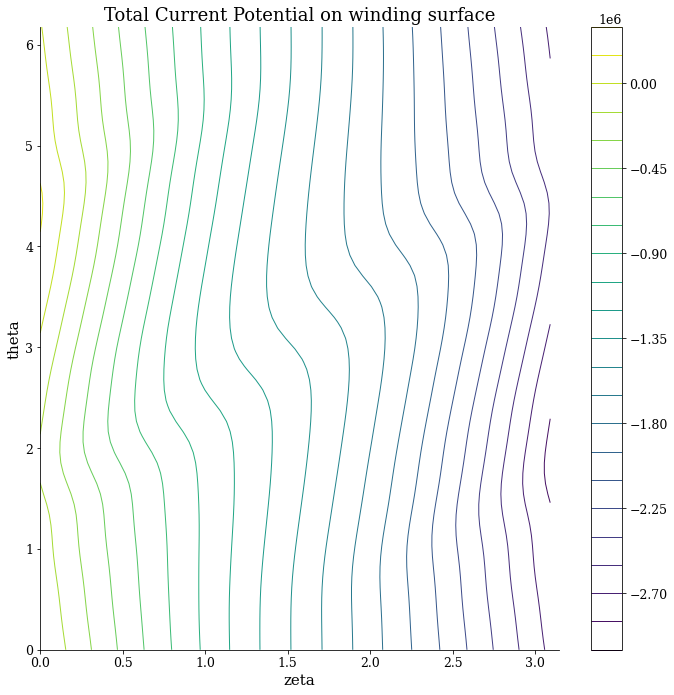

In [5]:
# plot_regcoil_outputs(field_modular,data,eq)
plot_regcoil_outputs(field_helical,result_helical,eq)


# Modular coil figure

In [6]:
# field=field_modular
# coils_modular = field.cut_surface_current_into_coils(18,step=2)

# from desc.plotting import *
# figsize=(10,10)
# fig=plot_3d(eq,"|B|",figsize=figsize,zeroline=False,showgrid=False)
# fig=plot_coils(coils_modular,fig=fig,figsize=figsize)
# fig.update_layout(
#     scene=dict(
#         xaxis=dict(showticklabels=False),
#         yaxis=dict(showticklabels=False),
#         zaxis=dict(showticklabels=False),
#         xaxis_title=' ',
#         yaxis_title=' ',
#         zaxis_title=' ',
#     ),
# )
# fig.show()
# # fig.write_image("figures/modular_coils.png")



In [7]:
# # Bn from surf current
# grid = LinearGrid(M=80, N=80,NFP=eq.NFP)
# eval_grid = LinearGrid(M=40, N=40,NFP=eq.NFP)
# Bn,_ = field.compute_Bnormal(eq,eval_grid=eval_grid,source_grid=grid)

# th = eval_grid.nodes[:,1].reshape((eval_grid.num_theta, eval_grid.num_zeta))
# ze = eval_grid.nodes[:,2].reshape((eval_grid.num_theta, eval_grid.num_zeta))

# plt.figure(figsize=(8,8))
# plt.contourf(ze,th, Bn.reshape((eval_grid.num_theta, eval_grid.num_zeta)))
# plt.colorbar()
# plt.xlabel(r"$\zeta$")
# plt.ylabel(r"$\theta$")






In [8]:
# # Bn from coils
# # grid = LinearGrid(M=80, N=80,NFP=eq.NFP)
# eval_grid = LinearGrid(M=40, N=40,NFP=eq.NFP)
# Bn,_ = coils_modular.compute_Bnormal(eq,eval_grid=eval_grid)

# th = eval_grid.nodes[:,1].reshape((eval_grid.num_theta, eval_grid.num_zeta))
# ze = eval_grid.nodes[:,2].reshape((eval_grid.num_theta, eval_grid.num_zeta))

# plt.figure(figsize=(8,8))
# plt.contourf(ze,th, Bn.reshape((eval_grid.num_theta, eval_grid.num_zeta)))
# plt.colorbar()
# plt.xlabel(r"$\zeta$")
# plt.ylabel(r"$\theta$")






# Helical coil figure

In [9]:
%pdb

Automatic pdb calling has been turned ON


/home/dpanici/miniconda3/envs/desc-env/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


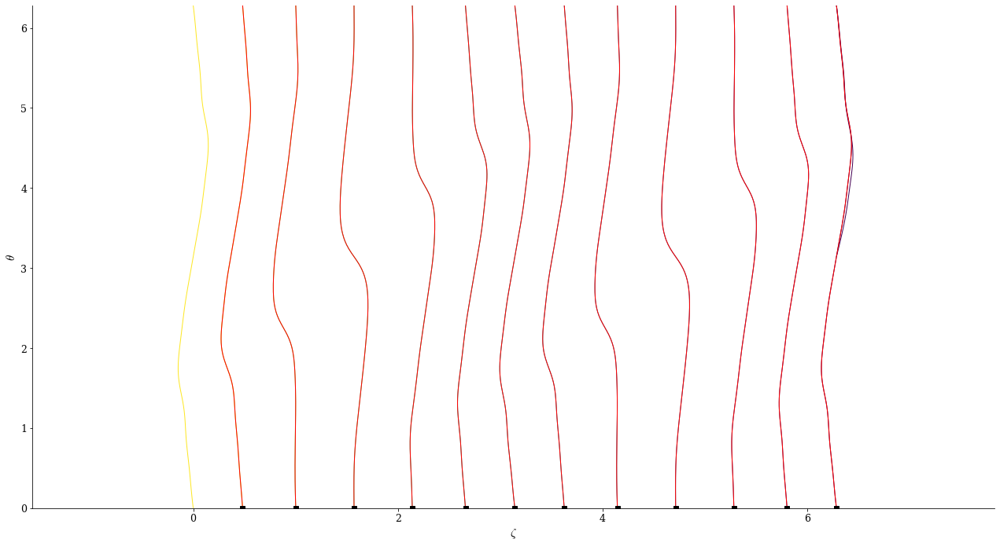

In [10]:
field=field_helical
desirednumcoils=12
coils_helical, data_debug = field.cut_surface_current_into_coils(desirednumcoils,step=1,debug=True,show_plots=True)

In [11]:
field.I

0.0

In [12]:
len(data_debug["contour_theta"])

12

In [13]:
len(data_debug["contour_zeta"])

12

In [14]:
len(coils_helical)
# PROBLEM why is the coils less than desired???

12

In [15]:
from desc.plotting import *
figsize=(10,10)
fig=plot_3d(eq,"|B|",figsize=figsize,zeroline=False,showgrid=False)

# colors=["black","cyan","darkmagenta"]*2
# for coi,col in zip(coils_helical,colors):
#     fig=plot_coils(coi,fig=fig,color=col,figsize=figsize)
ind=6
fig=plot_coils(coils_helical[ind],fig=fig,figsize=figsize)
fig.update_layout(
    scene=dict(
        xaxis=dict(showticklabels=False),
        yaxis=dict(showticklabels=False),
        zaxis=dict(showticklabels=False),
        xaxis_title=' ',
        yaxis_title=' ',
        zaxis_title=' ',
    ),
)
fig.show()
# fig.write_image("figures/helical_coils.png")

/home/dpanici/miniconda3/envs/desc-env/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



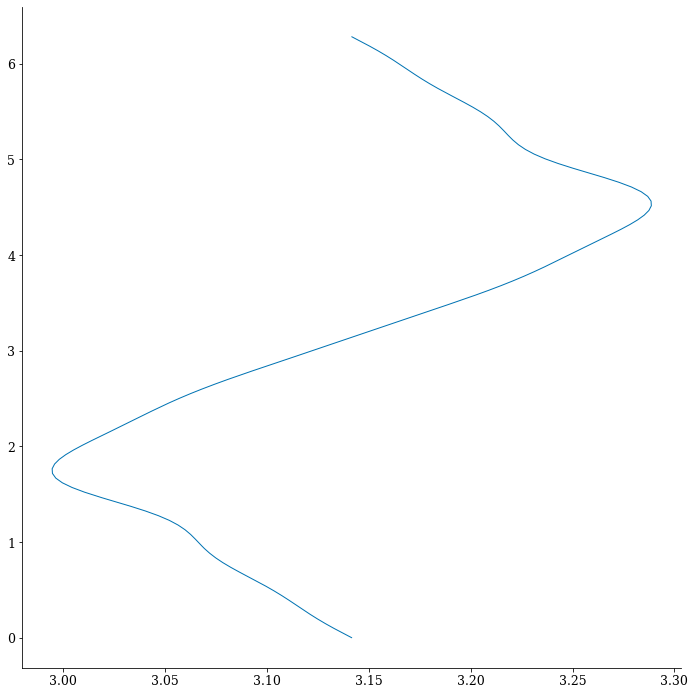

In [16]:
plt.figure(figsize=(10,10))
plt.plot(data_debug["contour_zeta"][ind], data_debug["contour_theta"][ind])

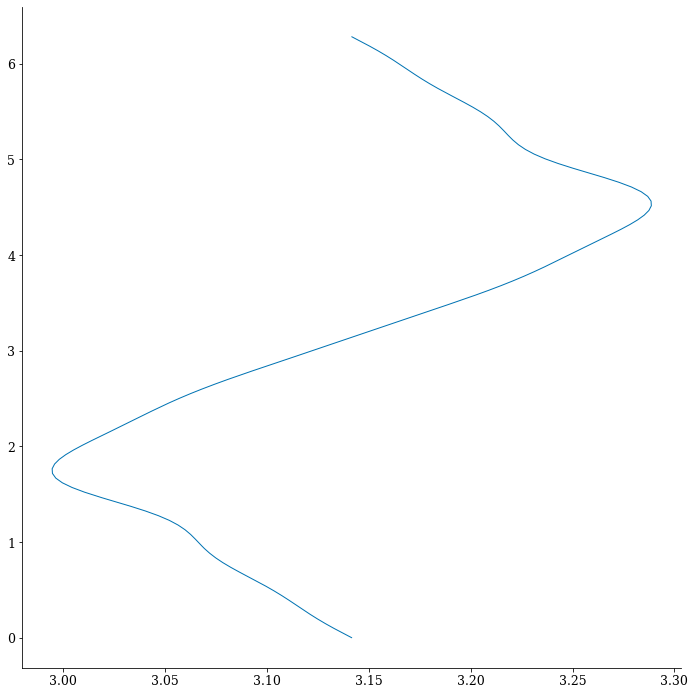

In [17]:
plt.figure(figsize=(10,10))
plt.plot(data_debug["contour_zeta_pre_extend"][ind], data_debug["contour_theta_pre_extend"][ind])

In [18]:
data_debug["contour_zeta_pre_extend"]

[array([6.28318531, 6.28761985, 6.29194616, 6.29608196, 6.29998555,
        6.30366398, 6.30717108, 6.307729  , 6.31059342, 6.3140423 ,
        6.31762223, 6.32141096, 6.32544093, 6.32968683, 6.33227269,
        6.3340592 , 6.33841789, 6.3426104 , 6.34648908, 6.34994786,
        6.35294729, 6.355528  , 6.35681638, 6.35780801, 6.35998144,
        6.36229823, 6.36503031, 6.36844507, 6.3727662 , 6.3781283 ,
        6.38136008, 6.38452046, 6.39175198, 6.39948014, 6.40590377,
        6.40721367, 6.41435866, 6.42049558, 6.42527513, 6.42850457,
        6.43014509, 6.43028266, 6.42908791, 6.42677742, 6.42358308,
        6.41973066, 6.415426  , 6.41084617, 6.40613336, 6.40590377,
        6.401383  , 6.39666698, 6.39199969, 6.38735749, 6.38268768,
        6.38136008, 6.37791347, 6.3729636 , 6.36777666, 6.36230835,
        6.35681638, 6.3565381 , 6.35046161, 6.34412285, 6.33756765,
        6.33227269, 6.33085014, 6.32403047, 6.3171674 , 6.31030287,
        6.307729  , 6.30346726, 6.29667409, 6.28

In [19]:
data_debug["zeta_full_2D"] 

Array([[-1.57079633, -1.54625263, -1.52170894, ...,  7.80489425,
         7.82943794,  6.28318531],
       [-1.57079633, -1.54625263, -1.52170894, ...,  7.80489425,
         7.82943794,  6.28318531],
       [-1.57079633, -1.54625263, -1.52170894, ...,  7.80489425,
         7.82943794,  6.28318531],
       ...,
       [-1.57079633, -1.54625263, -1.52170894, ...,  7.80489425,
         7.82943794,  6.28318531],
       [-1.57079633, -1.54625263, -1.52170894, ...,  7.80489425,
         7.82943794,  6.28318531],
       [-1.57079633, -1.54625263, -1.52170894, ...,  7.80489425,
         7.82943794,  6.28318531]], dtype=float64)

In [20]:
data_debug["zeta_full"]

Array([-1.57079633e+00, -1.54625263e+00, -1.52170894e+00, -1.49716525e+00,
       -1.47262156e+00, -1.44807786e+00, -1.42353417e+00, -1.39899048e+00,
       -1.37444679e+00, -1.34990309e+00, -1.32535940e+00, -1.30081571e+00,
       -1.27627202e+00, -1.25172832e+00, -1.22718463e+00, -1.20264094e+00,
       -1.17809725e+00, -1.15355355e+00, -1.12900986e+00, -1.10446617e+00,
       -1.07992247e+00, -1.05537878e+00, -1.03083509e+00, -1.00629140e+00,
       -9.81747704e-01, -9.57204012e-01, -9.32660319e-01, -9.08116626e-01,
       -8.83572934e-01, -8.59029241e-01, -8.34485549e-01, -8.09941856e-01,
       -7.85398163e-01, -7.60854471e-01, -7.36310778e-01, -7.11767086e-01,
       -6.87223393e-01, -6.62679700e-01, -6.38136008e-01, -6.13592315e-01,
       -5.89048623e-01, -5.64504930e-01, -5.39961237e-01, -5.15417545e-01,
       -4.90873852e-01, -4.66330160e-01, -4.41786467e-01, -4.17242774e-01,
       -3.92699082e-01, -3.68155389e-01, -3.43611696e-01, -3.19068004e-01,
       -2.94524311e-01, -

ValueError: Contour levels must be increasing

> /home/dpanici/miniconda3/envs/desc-env/lib/python3.11/site-packages/matplotlib/contour.py(1173)_process_contour_level_args()
   1171 
   1172         if len(self.levels) > 1 and np.min(np.diff(self.levels)) <= 0.0:
-> 1173             raise ValueError("Contour levels must be increasing")
   1174 
   1175     def _process_levels(self):



ipdb>  exit


/home/dpanici/miniconda3/envs/desc-env/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



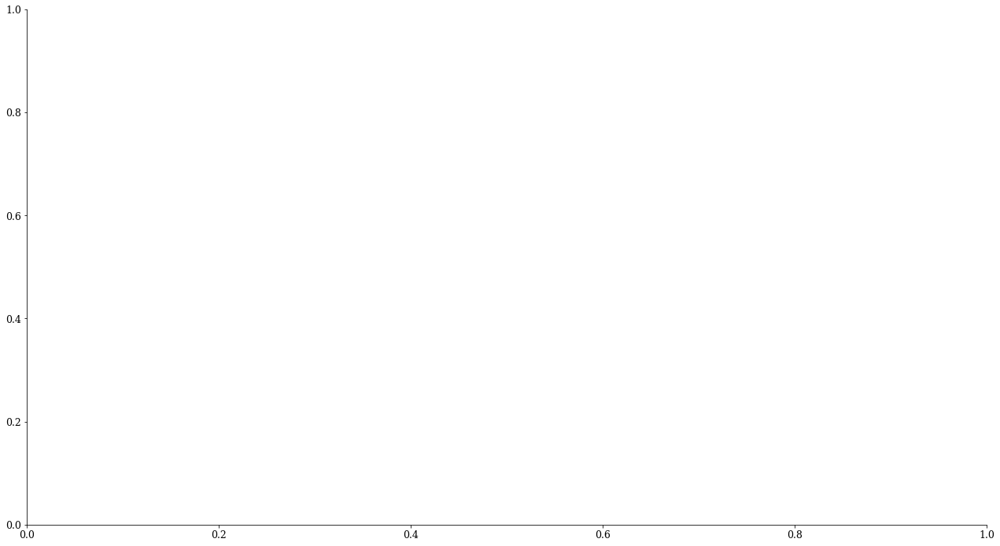

In [21]:
from desc.grid import Grid
from desc.backend import jnp
contours = jnp.linspace(
                0, jnp.abs(field.I), desirednumcoils + 1, endpoint=True
            )
contours = jnp.sort(contours)
coil_current = jnp.abs(field.I) / desirednumcoils

grid = Grid(
            np.vstack(
                (
                    jnp.zeros_like(data_debug["zeta_full_2D"].flatten(order="F")),
                    data_debug["theta_full_2D"].flatten(order="F"),
                    data_debug["zeta_full_2D"].flatten(order="F"),
                )
            ).T,
            sort=False,
        )
phi_total_full = field.compute("Phi", grid=grid)["Phi"].reshape(
            data_debug["theta_full"].size, data_debug["zeta_full"].size, order="F"
        )
plt.figure(figsize=(18, 10))
cdata = plt.contour(
    data_debug["zeta_full_2D"].T, data_debug["theta_full_2D"].T, np.transpose(phi_total_full), contours
)

In [ ]:
nfp=eq.NFP
helicity=-4
N_trial_contours=desirednumcoils
numCoils=0
contour_zeta = []
contour_theta = []
show_plots=True
import warnings
for j in range(N_trial_contours):
    try:
        p = cdata.collections[j].get_paths()[0]
    except Exception:
        print("no path found for given contour")
        continue
    v = p.vertices

    contour_zeta.append(v[:, 0])
    contour_theta.append(v[:, 1])

    # check if closed and if not throw warning
    if not jnp.isclose(
        jnp.abs(v[-1, 0] - v[0, 0]), 2 * jnp.pi / nfp
    ) or not jnp.isclose(
        jnp.abs(v[-1, 1] - v[0, 1]), 2 * jnp.pi * jnp.abs(helicity)
    ):
        warnings.warn(
            f"Detected a coil contour (coil index {j}) that may not be"
            "closed, this may lead to incorrect coils, "
            "check that the surface current potential contours do not contain"
            "any local maxima or window-pane-like structures,"
            " and that the current potential contours starting at the zeta=0 "
            "plane do not intersect the zeta=0 plane again."
            "Use `show_plots=True` to visualize the contours.",
            UserWarning,
        )

    numCoils += 1
    if show_plots:
        plt.plot(contour_zeta[-1], contour_theta[-1], "-r", linewidth=1)
        plt.plot(contour_zeta[-1][-1], contour_theta[-1][-1], "sk")

In [ ]:
plt.figure(figsize=(10,10))
plt.plot(contour_zeta[ind], contour_theta[ind])

In [ ]:
# Bn from surf current
grid = LinearGrid(M=80, N=80,NFP=eq.NFP)
eval_grid = LinearGrid(M=40, N=40,NFP=eq.NFP)
Bn,_ = field.compute_Bnormal(eq,eval_grid=eval_grid,source_grid=grid)

th = eval_grid.nodes[:,1].reshape((eval_grid.num_theta, eval_grid.num_zeta))
ze = eval_grid.nodes[:,2].reshape((eval_grid.num_theta, eval_grid.num_zeta))

plt.figure(figsize=(8,8))
plt.contourf(ze,th, Bn.reshape((eval_grid.num_theta, eval_grid.num_zeta)))
plt.colorbar()
plt.xlabel(r"$\zeta$")
plt.ylabel(r"$\theta$")






In [ ]:
# Bn from surf current
# grid = LinearGrid(M=80, N=80,NFP=eq.NFP)
eval_grid = LinearGrid(M=40, N=40,NFP=eq.NFP)
Bn,_ = coils_helical.compute_Bnormal(eq,eval_grid=eval_grid)

th = eval_grid.nodes[:,1].reshape((eval_grid.num_theta, eval_grid.num_zeta))
ze = eval_grid.nodes[:,2].reshape((eval_grid.num_theta, eval_grid.num_zeta))

plt.figure(figsize=(8,8))
plt.contourf(ze,th, Bn.reshape((eval_grid.num_theta, eval_grid.num_zeta)))
plt.colorbar()
plt.xlabel(r"$\zeta$")
plt.ylabel(r"$\theta$")






In [ ]:
# Bn from surf current
grid = LinearGrid(M=80, N=80,NFP=eq.NFP)
eval_grid = grid
phi = field.compute("Phi",grid=grid)["Phi"]
th = eval_grid.nodes[:,1].reshape((eval_grid.num_theta, eval_grid.num_zeta))
ze = eval_grid.nodes[:,2].reshape((eval_grid.num_theta, eval_grid.num_zeta))

plt.figure(figsize=(8,8))
plt.contour(ze,th, phi.reshape((eval_grid.num_theta, eval_grid.num_zeta)))
plt.colorbar()
plt.xlabel(r"$\zeta$")
plt.ylabel(r"$\theta$")
plt.title("Phi")


plt.figure(figsize=(8,8))
plt.contourf(ze,th, phi.reshape((eval_grid.num_theta, eval_grid.num_zeta)))
plt.colorbar()
plt.xlabel(r"$\zeta$")
plt.ylabel(r"$\theta$")
plt.title("Phi")


In [ ]:
# coils_helical = field.cut_surface_current_into_coils(8,step=1,show_plots=True)


In [ ]:
cc=coils_helical[-1]
plt.figure()
plt.plot(np.linspace(0,2*np.pi,cc.X.size),cc.X)
plt.xlim([0,1])
plt.figure()
plt.plot(np.linspace(0,2*np.pi,cc.X.size),cc.Y)
plt.xlim([0,1])
plt.figure()
plt.plot(np.linspace(0,2*np.pi,cc.X.size),cc.Z,"o-")
plt.xlim([0,1])


In [ ]:
cc=coils_helical[0]
plt.figure()
plt.plot(np.linspace(0,2*np.pi,cc.X.size),cc.X)
# plt.xlim([0,1])
plt.figure()
plt.plot(np.linspace(0,2*np.pi,cc.X.size),cc.Y)
# plt.xlim([0,1])
plt.figure()
plt.plot(np.linspace(0,2*np.pi,cc.X.size),cc.Z,"o-")
# plt.xlim([0,1])


In [ ]:
from desc.compute import xyz2rpz
coords_rpz = xyz2rpz(np.vstack([cc.X,cc.Y,cc.Z]).T)
plt.figure()
plt.plot(np.linspace(0,2*np.pi,cc.X.size),coords_rpz[:,0])
plt.ylabel("R")
plt.xlim([0,1])
plt.figure()
plt.plot(np.linspace(0,2*np.pi,cc.X.size),coords_rpz[:,1])
plt.xlim([0,1])
plt.xlabel("phi")
plt.figure()
plt.plot(np.linspace(0,2*np.pi,cc.X.size),coords_rpz[:,2])
plt.xlabel("Z")
plt.xlim([0,1])



In [ ]:
plt.plot(range(data_debug["theta_full"].size),data_debug["theta_full"])

In [ ]:
plt.plot(range(data_debug["zeta_full"].size),data_debug["zeta_full"])

In [ ]:
diff=np.diff(data_debug["theta_full"])
print(np.max(diff))
print(np.min(diff))
print(np.mean(diff))


In [ ]:
np.where(diff==0.0)

In [ ]:
np.where(np.isclose(diff,0.0))[0].size

In [ ]:
np.where(diff==0.0)[0].size

In [ ]:
data_debug["theta_full"][126:129]

In [ ]:
diff=np.diff(data_debug["zeta_full"])
print(np.max(diff))
print(np.min(diff))
print(np.mean(diff))


In [ ]:
np.where(np.isclose(diff,0.0))[0].size

In [ ]:
field.I

In [ ]:
# field=field_helical

# npts=80
# thetas = np.arange(0,20*np.pi+1e-10,2*np.pi/npts)
# zetas = np.arange(0,2*np.pi/eq.NFP+1e-10,2*np.pi/npts)
# thetas, zetas = np.meshgrid(thetas,zetas,indexing="xy")
# thetas = thetas.flatten("F")
# zetas = zetas.flatten("F")

# from desc.grid import Grid
# grid = Grid(np.vstack([np.ones_like(zetas),thetas,zetas]).T)
# p=field.compute("Phi",grid=grid)["Phi"]
# p=p.reshape(grid.num_theta, grid.num_zeta)
# plt.rcParams.update({"font.size":28})
# plt.figure(figsize=(9,8))
# levels = np.flip(np.linspace(2*field.I,field.G/eq.NFP,10))
# plt.contourf(grid.nodes[:,2].reshape(grid.num_theta, grid.num_zeta),grid.nodes[:,1].reshape(grid.num_theta, grid.num_zeta),p,levels=levels)
# # plt.colorbar()

# # coil contours
# top_ind=3
# bot_ind=6
# ind=4
# coilcolor="m"
# plt.contour(grid.nodes[:,2].reshape(grid.num_theta, grid.num_zeta),grid.nodes[:,1].reshape(grid.num_theta, grid.num_zeta),p,levels=[levels[ind]],colors=[coilcolor],linewidths=[5],labels=["Coil"])
# plt.contour(grid.nodes[:,2].reshape(grid.num_theta, grid.num_zeta),grid.nodes[:,1].reshape(grid.num_theta, grid.num_zeta),p,levels=levels[top_ind:bot_ind],colors=[coilcolor],linewidths=[5],linestyles="solid")
# # halfway contours
# levels_half = levels+0.5*(levels[1]-levels[0])

# plt.contour(grid.nodes[:,2].reshape(grid.num_theta, grid.num_zeta),grid.nodes[:,1].reshape(grid.num_theta, grid.num_zeta),p,levels=levels_half[top_ind-1:bot_ind],colors=["k"],linewidths=[3],linestyles="dashed")



# # locs,labels=plt.yticks()
# # xlocs,xlabels=plt.xticks()

# # plt.yticks(np.append(locs[0],[2*np.pi,4*np.pi]), ["0",r"$2\pi$",r"$4\pi$"])
# # plt.xticks(np.append(xlocs[0],2*np.pi/eq.NFP), ["0",r"$2\pi/{N_{FP}}$"])



# plt.xlabel(r"$\zeta'$",color="k")
# plt.ylabel(r"$\theta'$",color="k")

# plt.plot([1,1],[1,1],f"{coilcolor}-",label=r"$\Phi$ Contour (Coil)",lw=5)
# plt.plot([1,1],[1,1],"k--",label=r"Halfway $\Phi$ Contour",lw=3)
# plt.legend(loc="lower right",fontsize=18)
# plt.annotate(r"$\{$",fontsize=40,
#             xy=(-0.04, 0.165),  xycoords="axes fraction"
#             )
# # plt.axvline(-0.01,c="m",linewidth=15,ymax=0.18)
# plt.text(-0.85,2.25,r"$I_{coil}=\Delta \Phi$",size=32,c=coilcolor)


# plt.title("Current Potential on Winding Surface",color="k",size=24)
# # plt.savefig("figures/coil_contours_helical.png")

In [ ]:
data_debug["theta_full"]

In [ ]:
data_debug["contours"]

In [ ]:
-field.G/field.I